### LINK FOR THE DATABASE: https://drive.google.com/file/d/1edaBSDd-DL3_aojydA2w_yNBXANOa9oj/view?usp=sharing

In [403]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import datetime

## Data Preprocessing

In [405]:
pd.set_option('display.max_columns', None)

In [407]:
df = pd.read_csv('train.csv')

In [408]:
df.index = df['id']

In [409]:
df.drop('id', inplace = True, axis = 1)

In [410]:
df['date'] =pd.to_datetime(df['date'])

In [275]:
df.nunique()

date             1684
store_nbr          54
family             33
sales          379610
onpromotion       362
dtype: int64

In [277]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3000888 entries, 0 to 3000887
Data columns (total 5 columns):
 #   Column       Dtype         
---  ------       -----         
 0   date         datetime64[ns]
 1   store_nbr    int64         
 2   family       object        
 3   sales        float64       
 4   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(1)
memory usage: 137.4+ MB


In [279]:
df.describe()

,date,store_nbr,sales,onpromotion
count,3000888,3.000888e+06,3.000888e+06,3.000888e+06
mean,2015-04-24 08:27:04.703088384,2.750000e+01,3.577757e+02,2.602770e+00
min,2013-01-01 00:00:00,1.000000e+00,0.000000e+00,0.000000e+00
25%,2014-02-26 18:00:00,1.400000e+01,0.000000e+00,0.000000e+00
50%,2015-04-24 12:00:00,2.750000e+01,1.100000e+01,0.000000e+00
75%,2016-06-19 06:00:00,4.100000e+01,1.958473e+02,0.000000e+00
max,2017-08-15 00:00:00,5.400000e+01,1.247170e+05,7.410000e+02
std,NaN,1.558579e+01,1.101998e+03,1.221888e+01


In [281]:
df

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,2013-01-01,1,BABY CARE,0.000,0
2,2013-01-01,1,BEAUTY,0.000,0
3,2013-01-01,1,BEVERAGES,0.000,0
4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...
3000883,2017-08-15,9,POULTRY,438.133,0
3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,2017-08-15,9,PRODUCE,2419.729,148


In [283]:
is_null = df.isnull()

In [285]:
is_null.sum() ##Number of Null Values

date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64

In [287]:
date_list = pd.date_range(df['date'][0], df['date'][3000887])

In [289]:
len(date_list)

1688

In [29]:
stores = df['store_nbr'].unique()

In [31]:
stores.sort()

In [33]:
stores

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54])

In [35]:
df1 = df.drop(['store_nbr', 'family','onpromotion'], axis = 1)

In [37]:
df1

,date,sales
id,,
0,2013-01-01,0.000
1,2013-01-01,0.000
2,2013-01-01,0.000
3,2013-01-01,0.000
4,2013-01-01,0.000
...,...,...
3000883,2017-08-15,438.133
3000884,2017-08-15,154.553
3000885,2017-08-15,2419.729


In [39]:
date_wise = df1.groupby('date').sum()

In [41]:
date_wise.describe()

,sales
count,1.684000e+03
mean,6.375564e+05
std,2.344102e+05
min,2.511619e+03
25%,4.427115e+05
50%,6.321889e+05
75%,7.859455e+05
max,1.463084e+06


In [43]:
date_wise.mean()

sales    637556.384919
dtype: float64

In [45]:
sales123 = list(date_wise['sales'])

In [47]:
sales123.sort()

In [49]:
print(sales123[-1], sales123[-2], sales123[-3], sales123[-4],sales123[-5])

1463083.962459 1402306.370834 1376511.520495 1345920.6048929 1306699.366897


In [51]:
date_wise[date_wise['sales'] == 1463083.962459]

,sales
date,
2017-04-01,1.463084e+06


In [53]:
date_wise[date_wise['sales'] == 1402306.370834]

,sales
date,
2017-01-02,1.402306e+06


In [55]:
date_wise[date_wise['sales'] == 1376511.520495]

,sales
date,
2017-06-04,1.376512e+06


In [57]:
date_wise[date_wise['sales'] == 1345920.6048929]

,sales
date,
2016-04-18,1.345921e+06


In [59]:
date_wise[date_wise['sales'] == 1306699.366897]

,sales
date,
2017-05-01,1.306699e+06


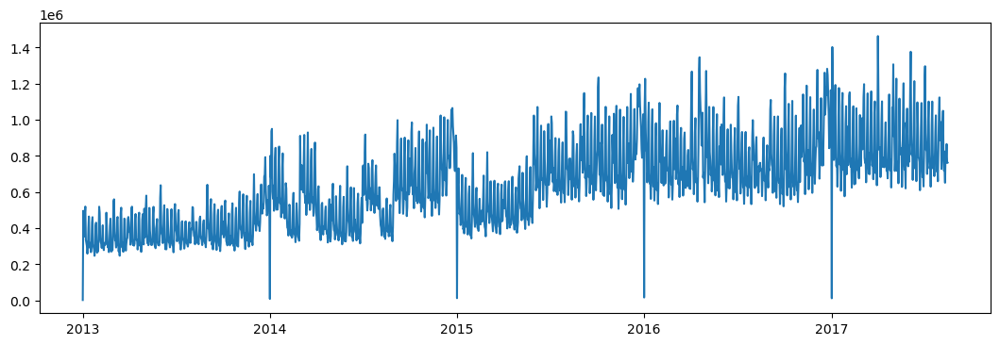

In [61]:
plt.figure(figsize= (13, 4))
plt.plot(date_wise)

In [63]:
df1_y1 = date_wise[df['date'][0]:(df['date'][0]+datetime.timedelta(days = 365))]

In [65]:
df1_y1

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229
...,...
2013-12-28,556952.305979
2013-12-29,499719.504924
2013-12-30,635134.735851


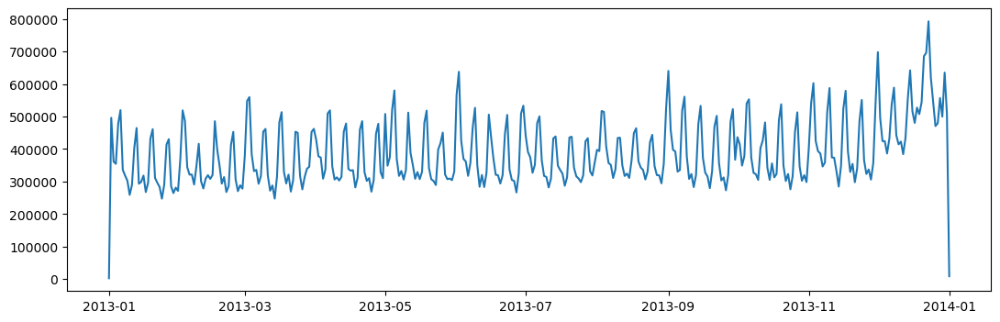

In [67]:
plt.figure(figsize= (13, 4))
plt.plot(df1_y1)

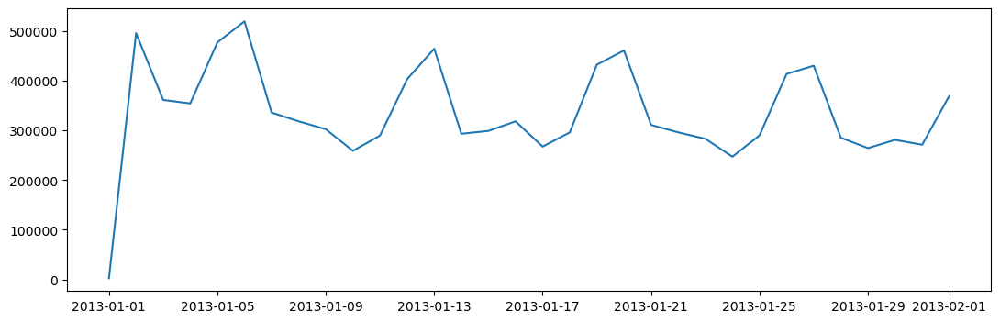

In [69]:
df1_y1_m1 = date_wise[df['date'][0]:(df['date'][0]+datetime.timedelta(days = 31))]
plt.figure(figsize= (13, 4))
plt.plot(df1_y1_m1)

## We can observe weekly trends, which are nearly constant throught the month, but show a increasing moving average, Along with a drop in sale on new year day

In [72]:
store_wise_sales = []
for i in range(1,55):
    store_wise_sales.append(df[df['store_nbr'] == i])

In [73]:
list(map(lambda x: x.drop(['store_nbr', 'family','onpromotion'], axis = 1, inplace = True), store_wise_sales))

/var/folders/7t/cv31kdkd7zg5scdfkr8cghqh0000gn/T/ipykernel_18202/2053184947.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  list(map(lambda x: x.drop(['store_nbr', 'family','onpromotion'], axis = 1, inplace = True), store_wise_sales))
/var/folders/7t/cv31kdkd7zg5scdfkr8cghqh0000gn/T/ipykernel_18202/2053184947.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  list(map(lambda x: x.drop(['store_nbr', 'family','onpromotion'], axis = 1, inplace = True), store_wise_sales))
/var/folders/7t/cv31kdkd7zg5scdfkr8cghqh0000gn/T/ipykernel_18202/2053184947.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [76]:
list(map(lambda x: x.groupby('date').sum(), store_wise_sales))

[                   sales
 date                    
 2013-01-01      0.000000
 2013-01-02   7417.148000
 2013-01-03   5873.244001
 2013-01-04   5919.879001
 2013-01-05   6318.785010
 ...                  ...
 2017-08-11   5403.742021
 2017-08-12   7543.623000
 2017-08-13   3902.782000
 2017-08-14  10433.314000
 2017-08-15   9823.551018
 
 [1684 rows x 1 columns],
                    sales
 date                    
 2013-01-01      0.000000
 2013-01-02  10266.718981
 2013-01-03   7612.540000
 2013-01-04   7526.377000
 2013-01-05   9539.566000
 ...                  ...
 2017-08-11  13081.771001
 2017-08-12  12382.416000
 2017-08-13  13766.822095
 2017-08-14  12211.461020
 2017-08-15  11196.260002
 
 [1684 rows x 1 columns],
                    sales
 date                    
 2013-01-01      0.000000
 2013-01-02  24060.348000
 2013-01-03  18570.745025
 2013-01-04  17392.097995
 2013-01-05  22700.872005
 ...                  ...
 2017-08-11  32885.759996
 2017-08-12  31903.476000
 2017-08

In [78]:
for i in range(54):
    store_wise_sales[i] = store_wise_sales[i].groupby('date').sum()

In [80]:
store_wise_sales[0]

,sales
date,
2013-01-01,0.000000
2013-01-02,7417.148000
2013-01-03,5873.244001
2013-01-04,5919.879001
2013-01-05,6318.785010
...,...
2017-08-11,5403.742021
2017-08-12,7543.623000
2017-08-13,3902.782000


/var/folders/7t/cv31kdkd7zg5scdfkr8cghqh0000gn/T/ipykernel_18202/3038405394.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize= (13, 4))


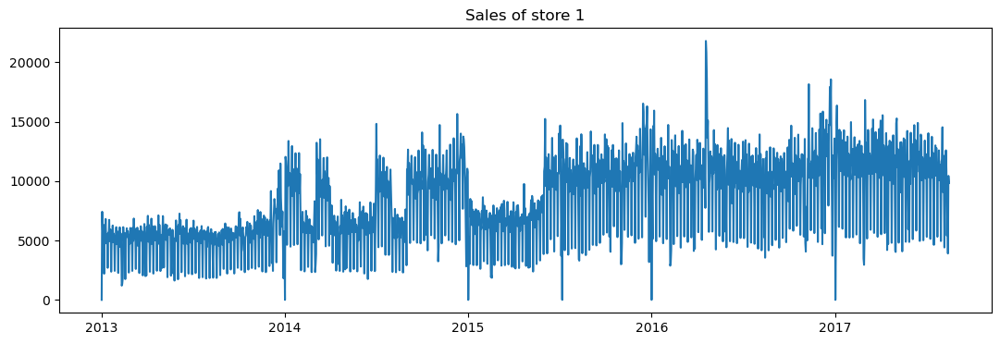

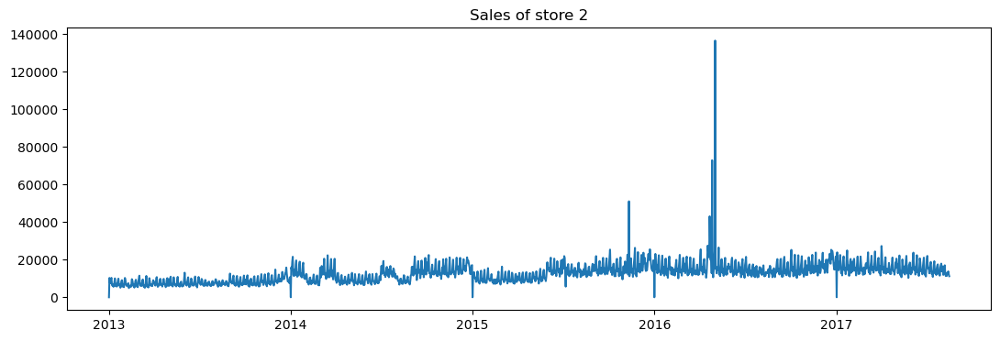

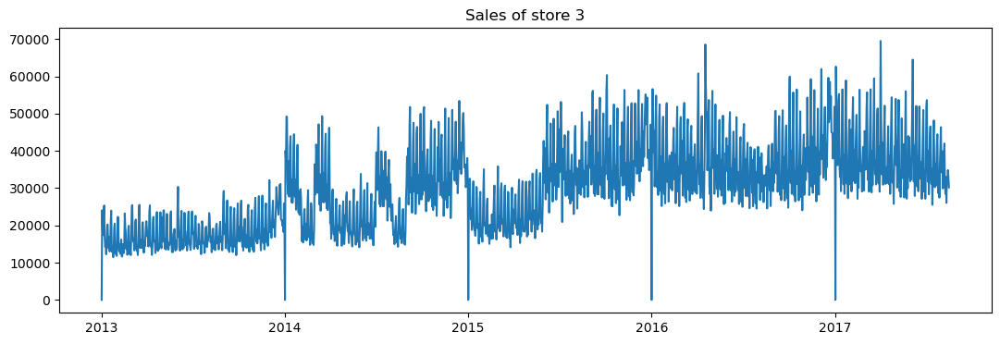

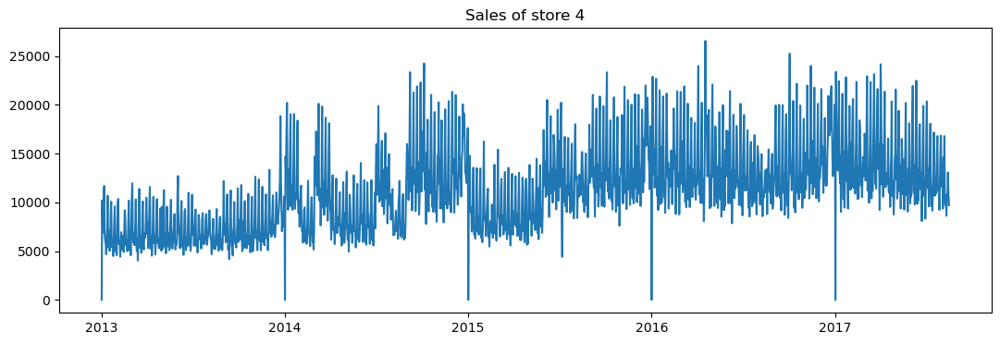

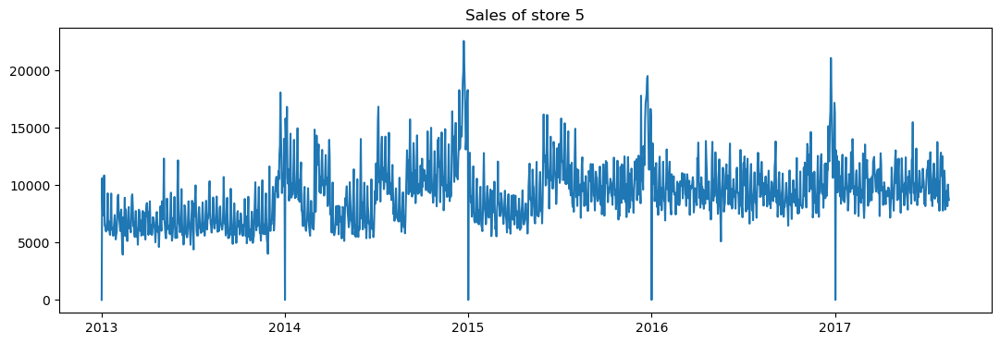

...

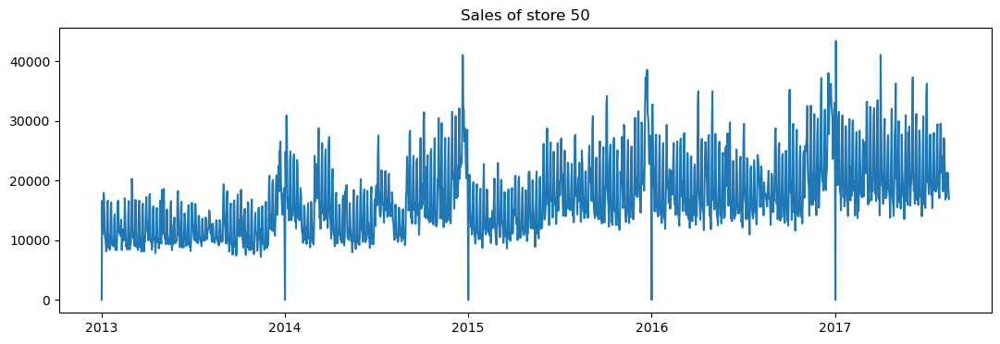

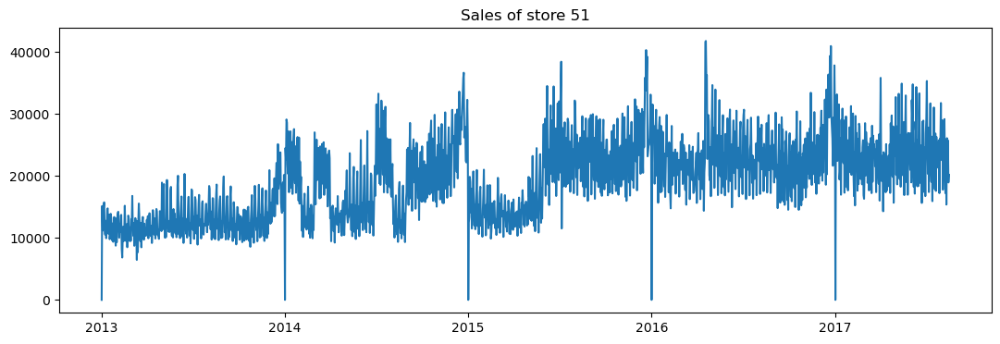

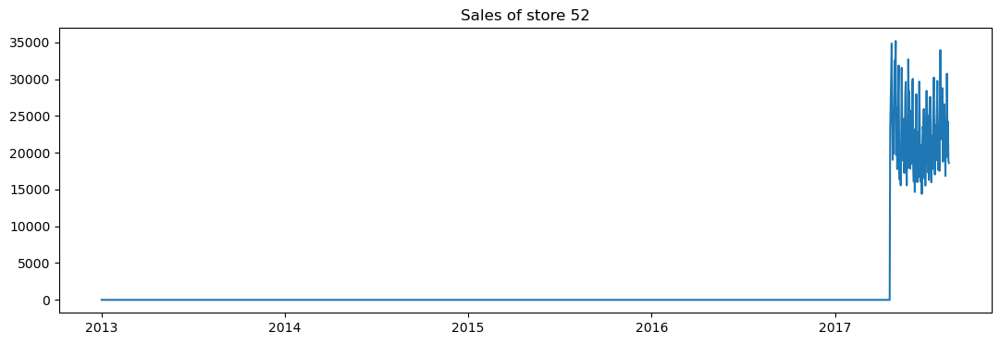

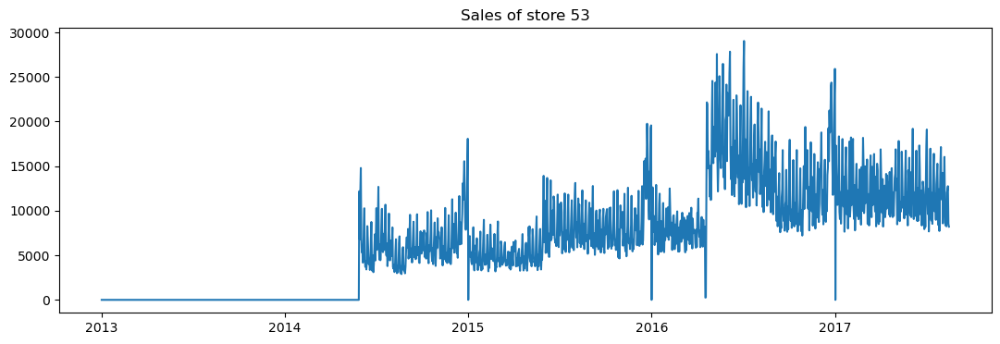

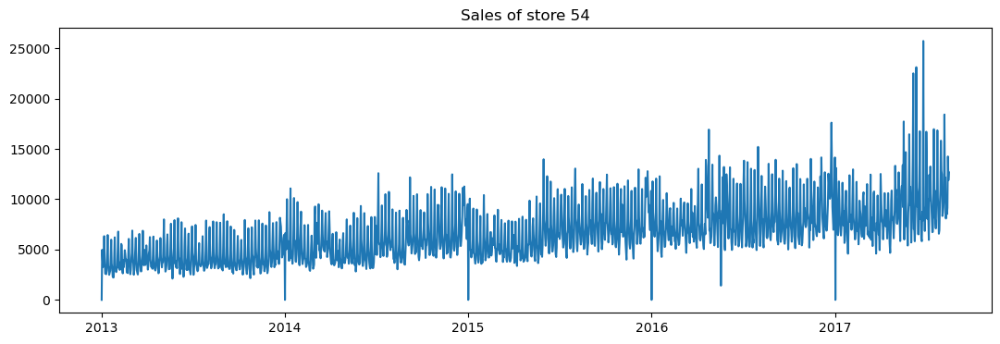

In [82]:
for i in range(54):
    plt.figure(figsize= (13, 4))
    plt.plot(store_wise_sales[i])
    plt.title('Sales of store ' + str(i+1))

# Making Predictions using ARIMA MODEL

In [84]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [85]:
date_wise

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229
...,...
2017-08-11,826373.722022
2017-08-12,792630.535079
2017-08-13,865639.677471


In [86]:
train_start_date = datetime.datetime(year = 2013, month = 1, day = 1)
train_end_date = datetime.datetime(year = 2017, month = 3, day = 15)
test_start_date = datetime.datetime(year = 2017, month = 3, day = 16)
test_end_date = datetime.datetime(year = 2017, month = 8, day = 15)

In [87]:
train_data = date_wise[train_start_date:train_end_date]

In [88]:
test_data = date_wise[test_start_date:test_end_date]

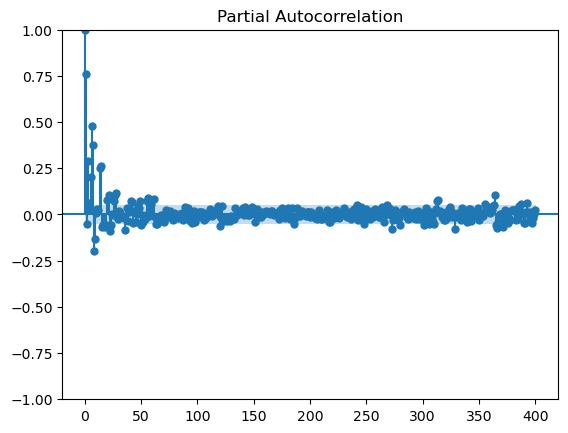

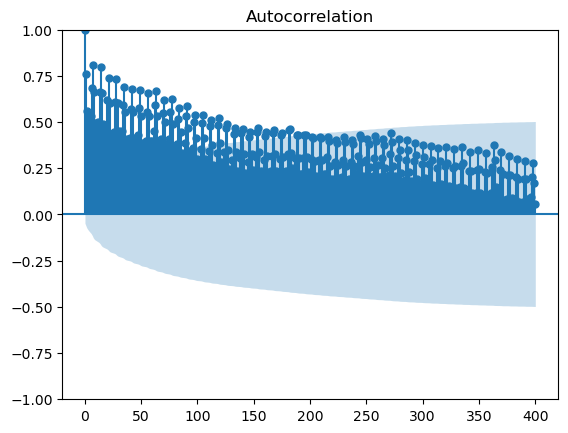

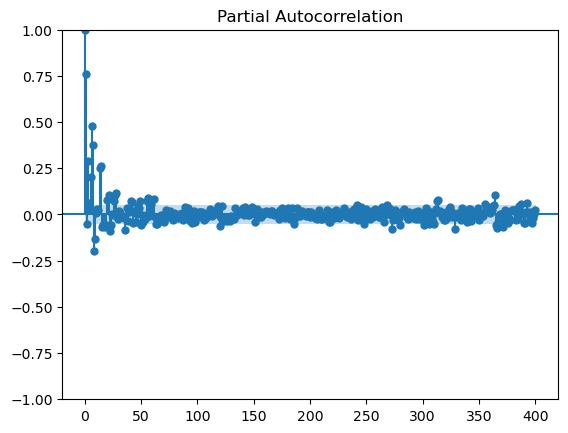

In [95]:
plot_acf(train_data, lags=400)
plot_pacf(train_data, lags = 400)

In [97]:
import itertools

In [99]:
train_data_copy = train_data[:]

In [101]:
for i in range(11):
    result = adfuller(train_data_copy[i:])
    print('Differenced times: ', i)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values: ', result[4])
    train_data_copy = train_data_copy.diff()

Differenced times:  0
ADF Statistic: -2.501170
p-value: 0.115190
Critical Values:  {'1%': -3.4346938104971554, '5%': -2.863458518103151, '10%': -2.567791394384679}
Differenced times:  1
ADF Statistic: -9.854113
p-value: 0.000000
Critical Values:  {'1%': -3.434702484091523, '5%': -2.8634623461571733, '10%': -2.567793432853942}
Differenced times:  2
ADF Statistic: -17.402272
p-value: 0.000000
Critical Values:  {'1%': -3.434699589047244, '5%': -2.863461068442911, '10%': -2.5677927524607194}
Differenced times:  3
ADF Statistic: -23.413569
p-value: 0.000000
Critical Values:  {'1%': -3.4347082857569995, '5%': -2.863464906691409, '10%': -2.5677947963598196}
Differenced times:  4
ADF Statistic: -25.601466
p-value: 0.000000
Critical Values:  {'1%': -3.4347111923936393, '5%': -2.863466189518188, '10%': -2.5677954794761004}
Differenced times:  5
ADF Statistic: -23.022322
p-value: 0.000000
Critical Values:  {'1%': -3.4347141029098758, '5%': -2.8634674740559594, '10%': -2.5677961635037003}
Differen

In [103]:
train_data

,sales
date,
2013-01-01,2.511619e+03
2013-01-02,4.960924e+05
2013-01-03,3.614612e+05
2013-01-04,3.544597e+05
2013-01-05,4.773501e+05
...,...
2017-03-11,1.001174e+06
2017-03-12,1.146007e+06
2017-03-13,7.543904e+05


In [105]:
train_data_diff = train_data.diff()


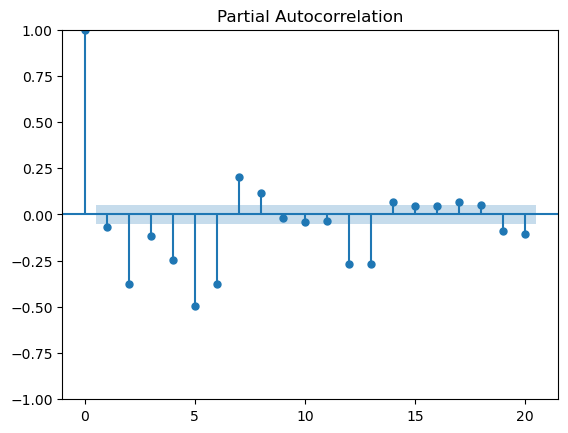

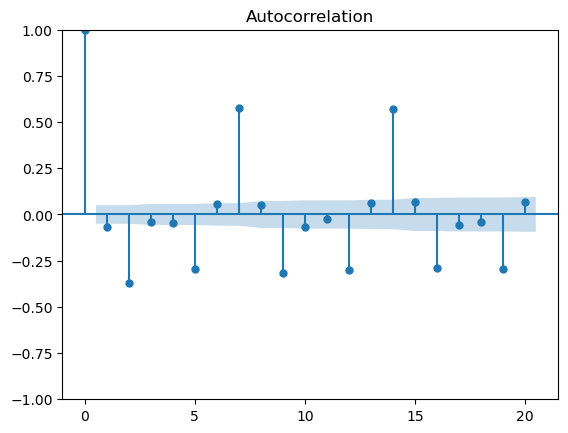

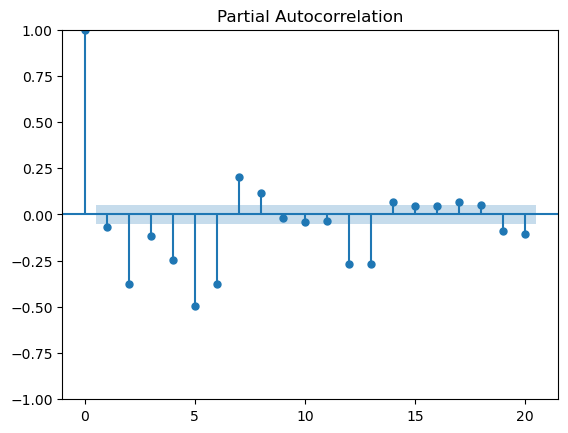

In [107]:
plot_acf(train_data_diff[1:], lags=20)
plot_pacf(train_data_diff[1:], lags = 20)

In [109]:
'''
p = range(1, 10)

d = range(1, 2)

q = range(1, 10)
pdq = list(itertools.product(p, d, q))
best_score, best_cfg = float("inf"), None
for param in pdq:
    try:
        model = ARIMA(train_data, order=param)
        model_fit = model.fit()
        if model_fit.aic < best_score:
            best_score, best_cfg = model_fit.aic, param
    except:
        continue
print('Best ARIMA%s AIC=%.2f' % (best_cfg, best_score))
'''

'\np = range(1, 10)\n\nd = range(1, 2)\n\nq = range(1, 10)\npdq = list(itertools.product(p, d, q))\nbest_score, best_cfg = float("inf"), None\nfor param in pdq:\n    try:\n        model = ARIMA(train_data, order=param)\n        model_fit = model.fit()\n        if model_fit.aic < best_score:\n            best_score, best_cfg = model_fit.aic, param\n    except:\n        continue\nprint(\'Best ARIMA%s AIC=%.2f\' % (best_cfg, best_score))\n'

In [111]:
model = ARIMA(train_data, order=(9,1,8))

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [113]:
model_fit = model.fit()

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [114]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  sales   No. Observations:                 1531
Model:                 ARIMA(9, 1, 8)   Log Likelihood              -19735.217
Date:                Wed, 18 Dec 2024   AIC                          39506.435
Time:                        01:37:59   BIC                          39602.429
Sample:                             0   HQIC                         39542.161
                               - 1531                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1786      0.169     -1.056      0.291      -0.510       0.153
ar.L2         -0.3744      0.115     -3.268      0.001      -0.599      -0.150
ar.L3         -0.2104      0.083     -2.522      0.012      -0.374      -0.047
ar.L4         -0.2143      0.089     -2.412      0.016      -0.388      -0.040
ar.L5         -0.2395      0.083     -2.881      0.004      -0.402      -0.077
ar.L6         -0.1654      0.088     -1.882      0.060      -0.338       0.007
ar.L7          0.7258      0.081      8.951      0.000       0.567       0.885
ar.L8         -0.0053      0.089     -0.060      0.952      -0.181       0.170
ar.L9          0.1302      0.039      3.353      0.001       0.054       0.206
ma.L1         -0.3293      0.172     -1.912      0.056      -0.667       0.008
ma.L2         -0.0004      0.055     -0.007      0.995      -0.109       0.108
ma.L3          0.0026      0.045      0.058      0.954      -0.086       0.091
ma.L4          0.0320      0.039      0.815      0.415      -0.045       0.109
ma.L5         -0.0055      0.040     -0.137      0.891      -0.084       0.073
ma.L6         -0.0642      0.034     -1.899      0.058      -0.130       0.002
ma.L7         -0.7247      0.033    -21.678      0.000      -0.790      -0.659
ma.L8          0.2668      0.129      2.068      0.039       0.014       0.520
sigma2      9.763e+09   1.37e-11   7.12e+20      0.000    9.76e+09    9.76e+09
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             42308.05
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               3.46   Skew:                            -0.86
Prob(H) (two-sided):                  0.00   Kurtosis:                        28.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.75e+36. Standard errors may be unstable.
"""

In [115]:
len(test_data)

153

In [116]:
predictions = model_fit.forecast(153)

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [117]:
predictions

1531    7.159284e+05
1532    7.890638e+05
1533    1.023276e+06
1534    1.029448e+06
1535    7.939998e+05
            ...     
1679    8.864998e+05
1680    1.009193e+06
1681    9.354116e+05
1682    7.990705e+05
1683    7.794132e+05
Name: predicted_mean, Length: 153, dtype: float64

In [118]:
predictions.index = test_data.index

In [119]:
predictions

date
2017-03-16    7.159284e+05
2017-03-17    7.890638e+05
2017-03-18    1.023276e+06
2017-03-19    1.029448e+06
2017-03-20    7.939998e+05
                  ...     
2017-08-11    8.864998e+05
2017-08-12    1.009193e+06
2017-08-13    9.354116e+05
2017-08-14    7.990705e+05
2017-08-15    7.794132e+05
Name: predicted_mean, Length: 153, dtype: float64

In [120]:
test_data

,sales
date,
2017-03-16,6.991082e+05
2017-03-17,8.123068e+05
2017-03-18,1.038907e+06
2017-03-19,1.157141e+06
2017-03-20,8.264289e+05
...,...
2017-08-11,8.263737e+05
2017-08-12,7.926305e+05
2017-08-13,8.656397e+05


In [121]:
residuals = test_data['sales'] - predictions

In [122]:
residuals

date
2017-03-16    -16820.238663
2017-03-17     23242.974449
2017-03-18     15630.653708
2017-03-19    127693.017108
2017-03-20     32429.134616
                  ...      
2017-08-11    -60126.067275
2017-08-12   -216562.242804
2017-08-13    -69771.972263
2017-08-14    -38148.052281
2017-08-15    -16751.237523
Length: 153, dtype: float64

<Axes: xlabel='date'>

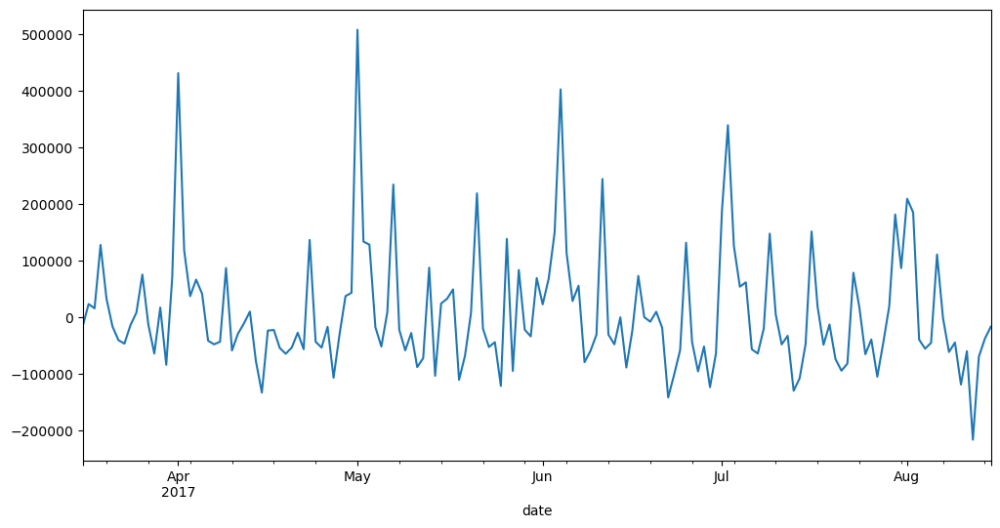

In [123]:
plt.figure(figsize=(12,6))
residuals.plot()

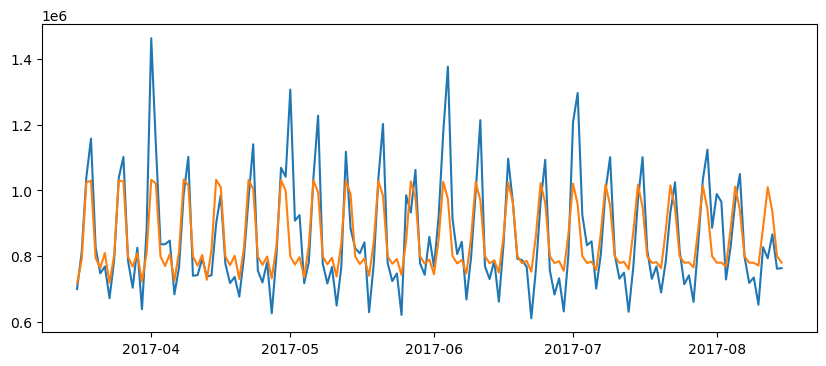

In [124]:
plt.figure(figsize=(10,4))
plt.plot(test_data)
plt.plot(predictions)

In [125]:
print('Mean Absolute Percentage Error: ', round(np.mean(abs(residuals/test_data['sales'])),4))

Mean Absolute Percentage Error:  0.0842


In [137]:
print('Root Mean Squared Error: ', np.sqrt(np.mean(residuals**2)))

Root Mean Squared Error:  107535.41459322546


# Making Predictions using SARIMA MODEL

In [142]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [144]:
result_add = seasonal_decompose(train_data['sales'], model='additive', filt=None, period=52, two_sided = True, extrapolate_trend=0)

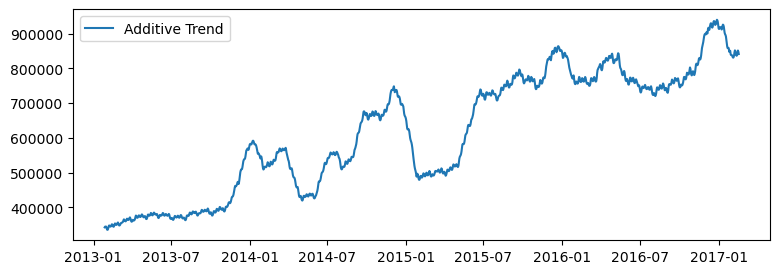

In [146]:
plt.figure(figsize=(9, 3))

plt.plot(result_add.trend, label='Additive Trend')
plt.legend()

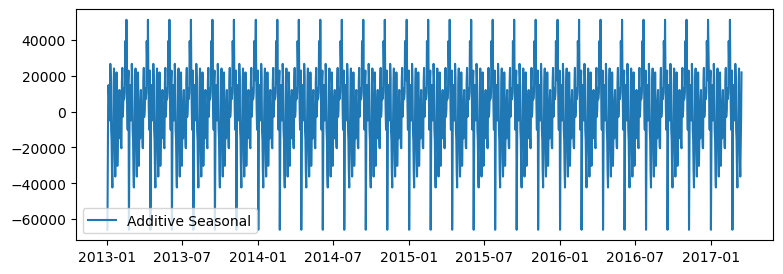

In [148]:
plt.figure(figsize=(9, 3))
plt.plot(result_add.seasonal, label='Additive Seasonal')
plt.legend()

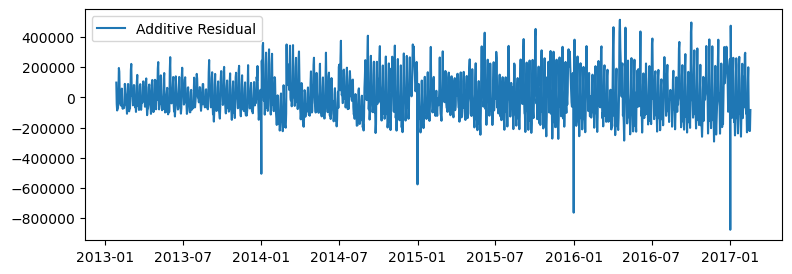

In [150]:
plt.figure(figsize=(9, 3))
plt.plot(result_add.resid, label='Additive Residual')
plt.legend()

In [152]:
result_add1 = seasonal_decompose(train_data.diff()['sales'][1:], model='additive', filt=None, period=52, two_sided = True, extrapolate_trend=0)

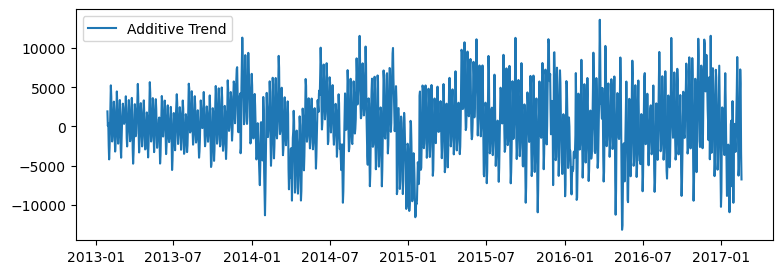

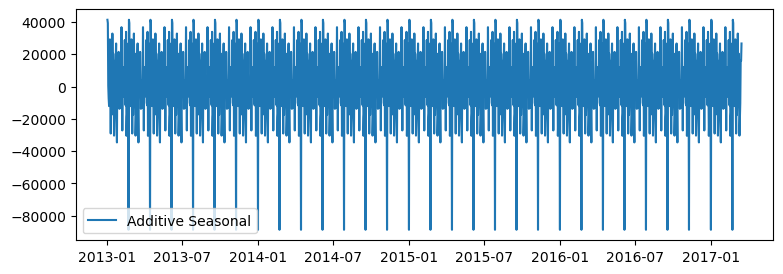

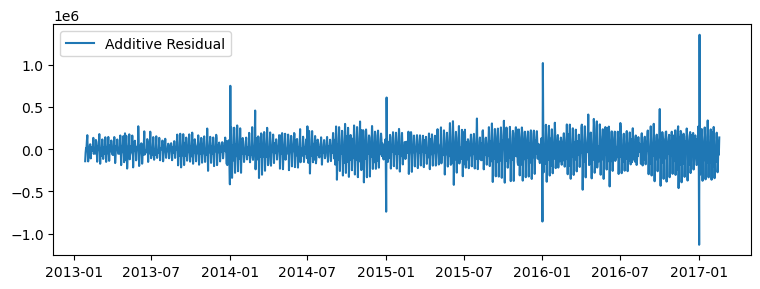

In [154]:
plt.figure(figsize=(9, 3))
plt.plot(result_add1.trend, label='Additive Trend')
plt.legend()
plt.figure(figsize=(9, 3))
plt.plot(result_add1.seasonal, label='Additive Seasonal')
plt.legend()
plt.figure(figsize=(9, 3))
plt.plot(result_add1.resid, label='Additive Residual')
plt.legend()

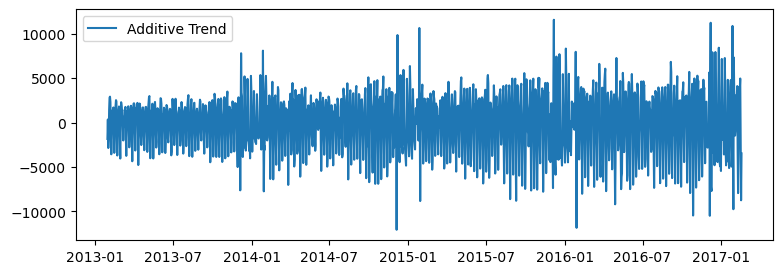

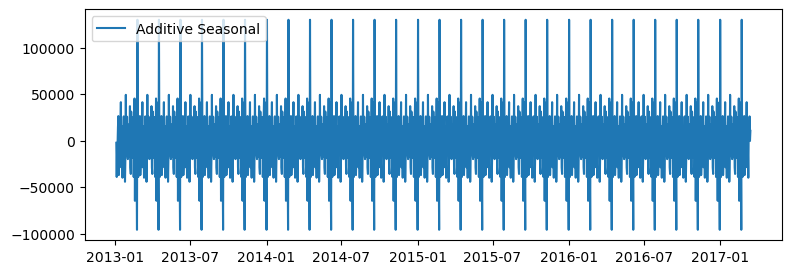

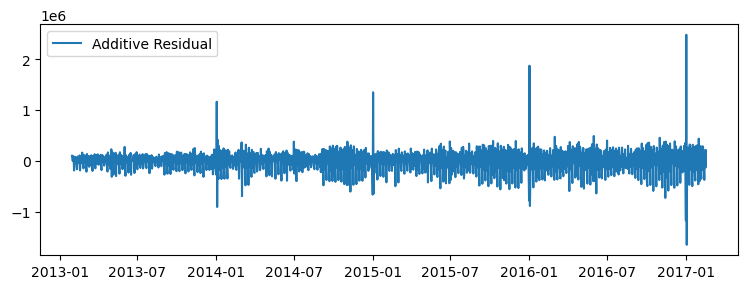

In [155]:
result_add2 = seasonal_decompose(train_data.diff().diff()['sales'][2:], model='additive', filt=None, period=52, two_sided = True, extrapolate_trend=0)
plt.figure(figsize=(9, 3))
plt.plot(result_add2.trend, label='Additive Trend')
plt.legend()
plt.figure(figsize=(9, 3))
plt.plot(result_add2.seasonal, label='Additive Seasonal')
plt.legend()
plt.figure(figsize=(9, 3))
plt.plot(result_add2.resid, label='Additive Residual')
plt.legend()

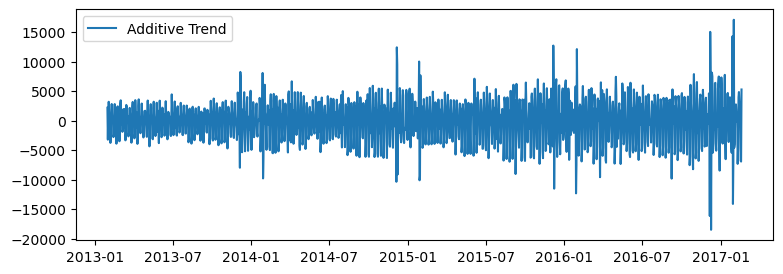

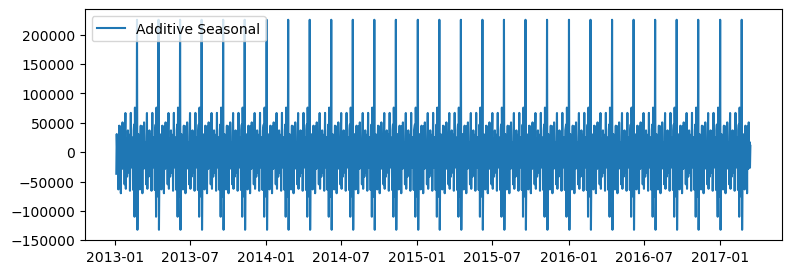

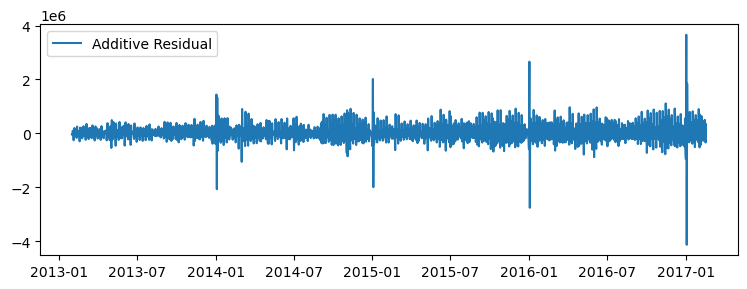

In [157]:
result_add3 = seasonal_decompose(train_data.diff().diff().diff()['sales'][3:], model='additive', filt=None, period=52, two_sided = True, extrapolate_trend=0)
plt.figure(figsize=(9, 3))
plt.plot(result_add3.trend, label='Additive Trend')
plt.legend()
plt.figure(figsize=(9, 3))
plt.plot(result_add3.seasonal, label='Additive Seasonal')
plt.legend()
plt.figure(figsize=(9, 3))
plt.plot(result_add3.resid, label='Additive Residual')
plt.legend()

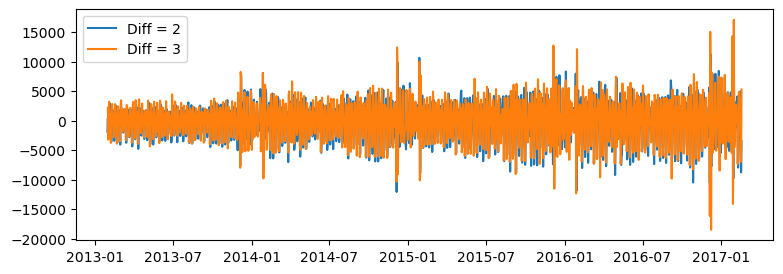

In [159]:
plt.figure(figsize=(9, 3))

plt.plot(result_add2.trend, label='Diff = 2')
plt.plot(result_add3.trend, label='Diff = 3')
plt.legend()

## 3rd differencing is almost useless, so lets stick with d = 2

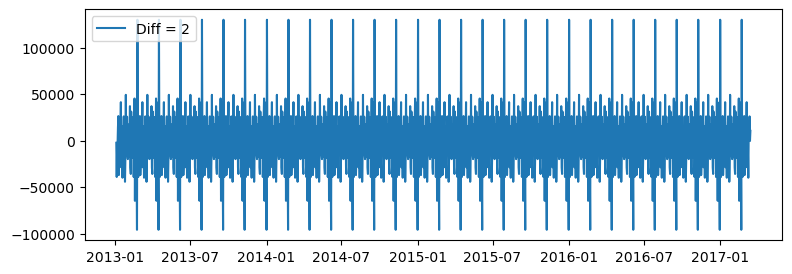

In [163]:
plt.figure(figsize=(9, 3))
#plt.plot(result_add.seasonal, label='Diff = 0')
#plt.plot(result_add1.seasonal, label='Diff = 1')
plt.plot(result_add2.seasonal, label='Diff = 2')
#plt.plot(result_add3.seasonal, label='Diff = 3')
plt.legend()

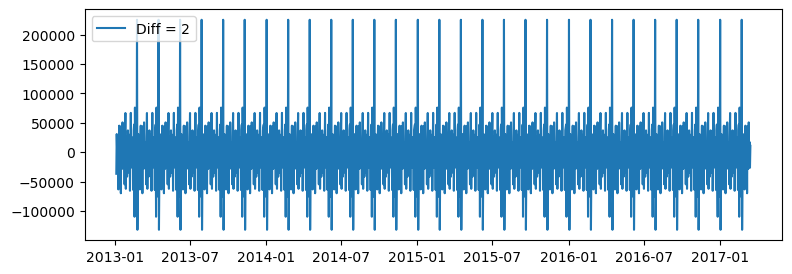

In [165]:
plt.figure(figsize=(9, 3))
#plt.plot(result_add.seasonal.diff(), label='Diff = 0')
#plt.plot(result_add1.seasonal.diff(), label='Diff = 1')
plt.plot(result_add2.seasonal.diff(), label='Diff = 2')
#plt.plot(result_add3.seasonal.diff(), label='Diff = 3')
plt.legend()

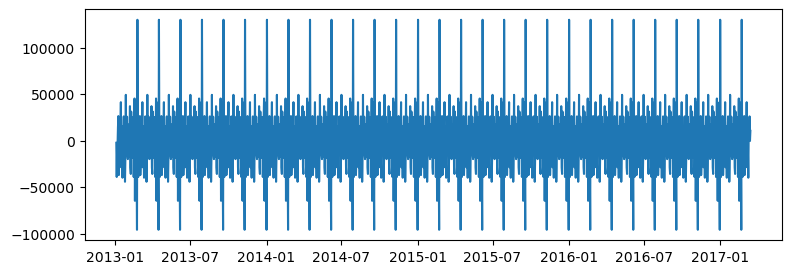

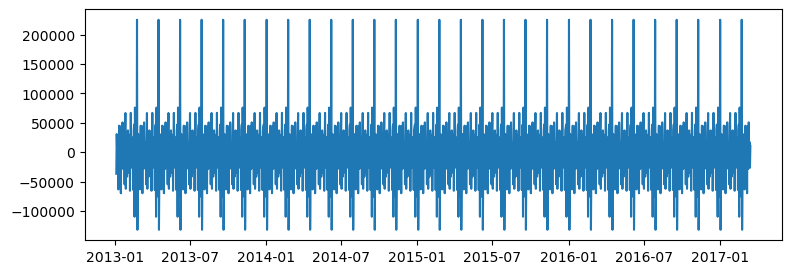

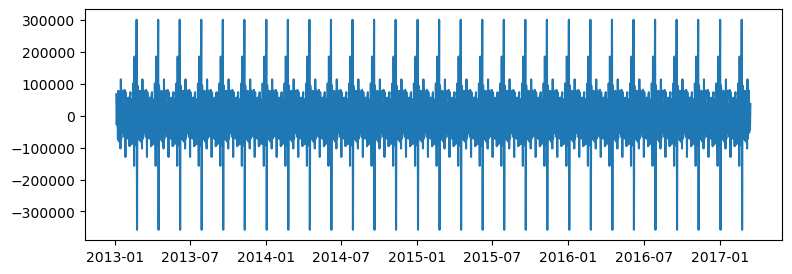

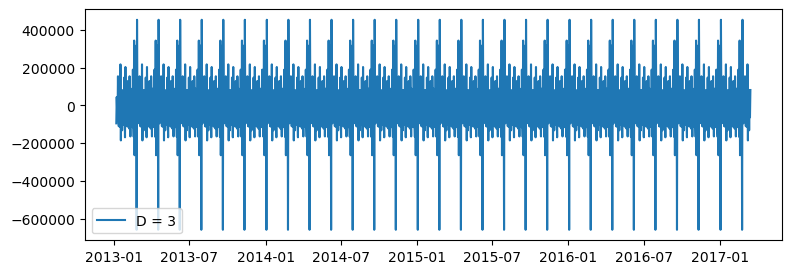

In [167]:
plt.figure(figsize=(9, 3))
plt.plot(result_add2.seasonal, label='D = 0')
plt.figure(figsize=(9, 3))
plt.plot(result_add2.seasonal.diff(), label='D = 1')
plt.figure(figsize=(9, 3))
plt.plot(result_add2.seasonal.diff().diff(), label='D = 2')
plt.figure(figsize=(9, 3))
plt.plot(result_add2.seasonal.diff().diff().diff(), label='D = 3')
plt.legend()

In [168]:
result_add2.resid.dropna()

date
2013-01-29    100060.868405
2013-01-30     53034.016370
2013-01-31     -3711.511769
2013-02-01     92360.275189
2013-02-02     67166.315036
                  ...      
2017-02-13   -375181.446606
2017-02-14    125690.030677
2017-02-15    211401.202605
2017-02-16   -129660.071217
2017-02-17    204730.829818
Name: resid, Length: 1477, dtype: float64

In [171]:
sma_window = 7  # 7-day moving average
sma = train_data['sales'].rolling(window=sma_window).mean()
sma

date
2013-01-01              NaN
2013-01-02              NaN
2013-01-03              NaN
2013-01-04              NaN
2013-01-05              NaN
                  ...      
2017-03-11    851281.607995
2017-03-12    843999.198976
2017-03-13    838891.647397
2017-03-14    830196.119493
2017-03-15    835135.437409
Name: sales, Length: 1531, dtype: float64

In [173]:
ema_window = 30  # 30-day moving average
ema = train_data['sales'].ewm(span=ema_window, adjust=False).mean()
ema

date
2013-01-01      2511.618999
2013-01-02     34355.541512
2013-01-03     55459.134390
2013-01-04     74749.491984
2013-01-05    100723.726128
                  ...      
2017-03-11    854328.838311
2017-03-12    873146.773063
2017-03-13    865485.070287
2017-03-14    854873.003472
2017-03-15    852340.673401
Name: sales, Length: 1531, dtype: float64

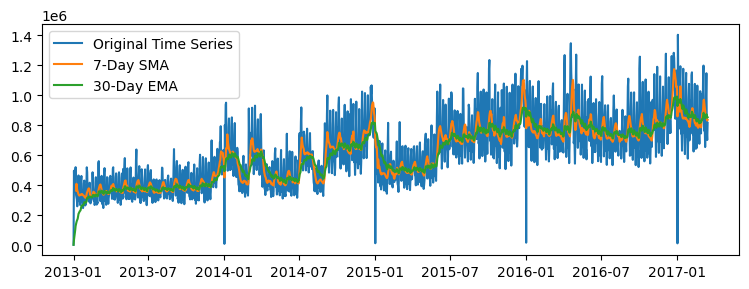

In [175]:
plt.figure(figsize=(9, 3))
plt.plot(train_data['sales'], label='Original Time Series')
plt.plot(sma, label=f'{sma_window}-Day SMA')
plt.plot(ema, label=f'{ema_window}-Day EMA')
plt.legend()

In [177]:
# SARIMA example
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [179]:
'''
p = [1,2,5,7]

d = range(1, 3)

q = [1,2,5,7]
P = [1,2,5,7]

D = range(1, 3)

Q = [1,2,5,7]
m = [7]
pdq = list(itertools.product(p, d, q))
PDQ = list(itertools.product(P, D, Q, m))

best_score, best_cfg = float("inf"), None
for param in pdq:
    for param1 in PDQ:
        try:
            model = SARIMAX(train_data, order=param, seasonal_order=param1)
            model_fit = model.fit()
            if model_fit.aic < best_score:
                best_score, best_cfg = model_fit.aic, param
        except:
            continue
print('Best ARIMA%s AIC=%.2f' % (best_cfg, best_score))
'''

'\np = [1,2,5,7]\n\nd = range(1, 3)\n\nq = [1,2,5,7]\nP = [1,2,5,7]\n\nD = range(1, 3)\n\nQ = [1,2,5,7]\nm = [7]\npdq = list(itertools.product(p, d, q))\nPDQ = list(itertools.product(P, D, Q, m))\n\nbest_score, best_cfg = float("inf"), None\nfor param in pdq:\n    for param1 in PDQ:\n        try:\n            model = SARIMAX(train_data, order=param, seasonal_order=param1)\n            model_fit = model.fit()\n            if model_fit.aic < best_score:\n                best_score, best_cfg = model_fit.aic, param\n        except:\n            continue\nprint(\'Best ARIMA%s AIC=%.2f\' % (best_cfg, best_score))\n'

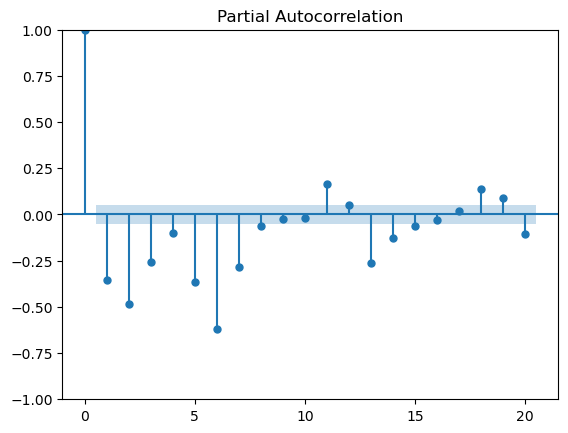

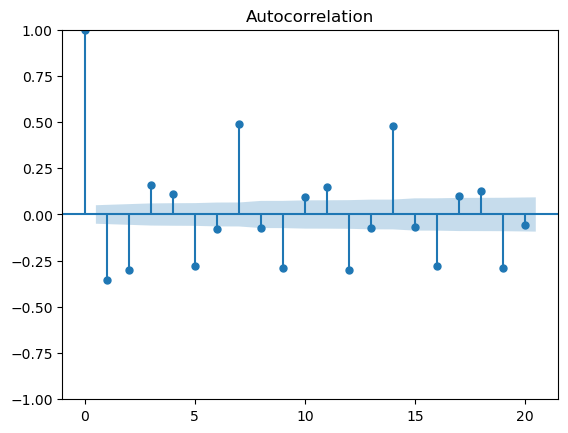

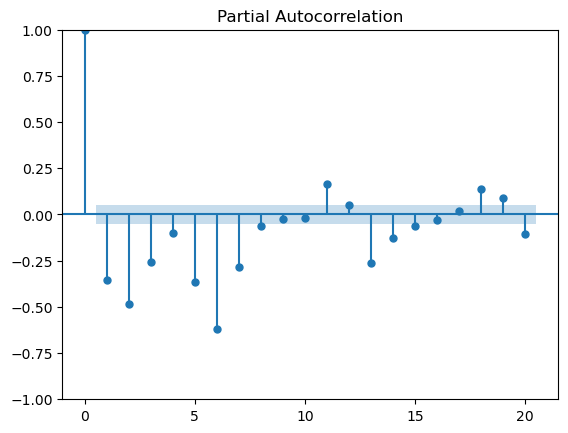

In [181]:
plot_acf(train_data_diff.diff()[2:], lags=20)
plot_pacf(train_data_diff.diff()[2:], lags = 20)

In [182]:
model_sar = SARIMAX(train_data,order=(5, 2, 6),seasonal_order=(2, 0, 3, 7))
model_sar_fit = model_sar.fit()
print(model_sar_fit.summary())

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           17     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.38773D+01    |proj g|=  1.28728D+00


 This problem is unconstrained.



At iterate    5    f=  1.29765D+01    |proj g|=  5.83999D-02

At iterate   10    f=  1.29482D+01    |proj g|=  1.97013D-02

At iterate   15    f=  1.29321D+01    |proj g|=  2.08063D-02

At iterate   20    f=  1.29291D+01    |proj g|=  1.33703D-02

At iterate   25    f=  1.29266D+01    |proj g|=  1.96023D-02

At iterate   30    f=  1.29247D+01    |proj g|=  1.56446D-02

At iterate   35    f=  1.29234D+01    |proj g|=  6.86093D-03

At iterate   40    f=  1.29231D+01    |proj g|=  6.48670D-03

At iterate   45    f=  1.29226D+01    |proj g|=  2.21496D-02


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



At iterate   50    f=  1.29225D+01    |proj g|=  7.99614D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   17     50     59      1     0     0   7.996D-03   1.292D+01
  F =   12.922462144120464     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
                                         SARIMAX Results                                         
Dep. Variable:                                     sales   No. Observations:                 1531
Model:             SARIMAX(5, 2, 6)x(2, 0, [1, 2, 3], 7)   Log Likelihood              -19784.290
Date:                                   Wed, 18 Dec 2024   AIC     

In [184]:
forecast = model_sar_fit.forecast(len(test_data))
print(forecast)

1531    6.992065e+05
1532    7.747787e+05
1533    1.028993e+06
1534    1.039372e+06
1535    7.805344e+05
            ...     
1679    7.852577e+05
1680    9.203687e+05
1681    9.260395e+05
1682    7.892040e+05
1683    7.697361e+05
Name: predicted_mean, Length: 153, dtype: float64


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [185]:
forecast.index = test_data.index

In [186]:
resids = test_data['sales'] - forecast

<Axes: xlabel='date'>

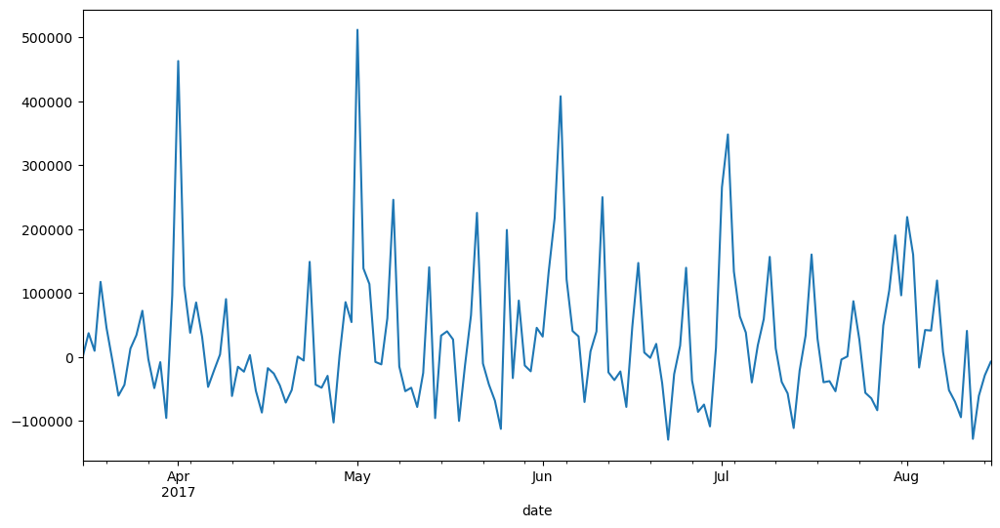

In [187]:
plt.figure(figsize=(12,6))
resids.plot()

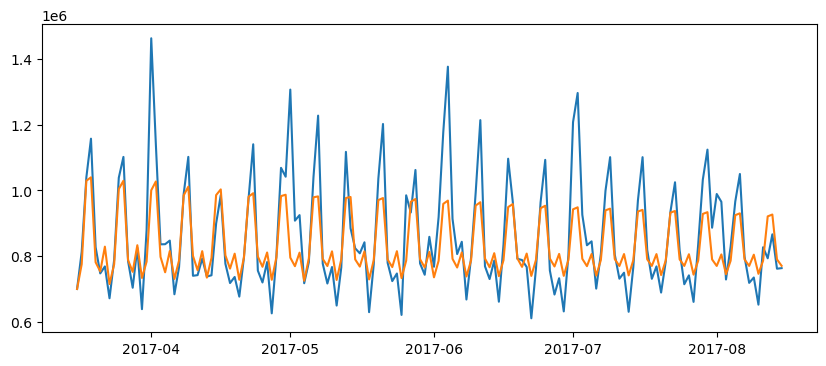

In [188]:
plt.figure(figsize=(10,4))
plt.plot(test_data)
plt.plot(forecast)

In [189]:
print('Mean Absolute Percentage Error: ', round(np.mean(abs(resids/test_data['sales'])),4))

Mean Absolute Percentage Error:  0.0792


In [190]:
print('Root Mean Squared Error: ', np.sqrt(np.mean(resids**2)))

Root Mean Squared Error:  109573.94013761044


# Making Predictions using Prophet MODEL

In [191]:
import prophet

In [192]:
import plotly.offline as py

In [193]:
from prophet.plot import plot_plotly

In [194]:
py.init_notebook_mode()

In [195]:
df

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,2013-01-01,1,BABY CARE,0.000,0
2,2013-01-01,1,BEAUTY,0.000,0
3,2013-01-01,1,BEVERAGES,0.000,0
4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...
3000883,2017-08-15,9,POULTRY,438.133,0
3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,2017-08-15,9,PRODUCE,2419.729,148


In [239]:
df_pf = df.drop(['store_nbr','family'], axis = 1)

In [241]:
df_pf['date'] = pd.to_datetime(df_pf['date'])

In [243]:
df_pf = df_pf.groupby('date').sum()

In [245]:
df_pf.index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2017-08-06', '2017-08-07', '2017-08-08', '2017-08-09',
               '2017-08-10', '2017-08-11', '2017-08-12', '2017-08-13',
               '2017-08-14', '2017-08-15'],
              dtype='datetime64[ns]', name='date', length=1684, freq=None)

<Axes: xlabel='date', ylabel='onpromotion'>

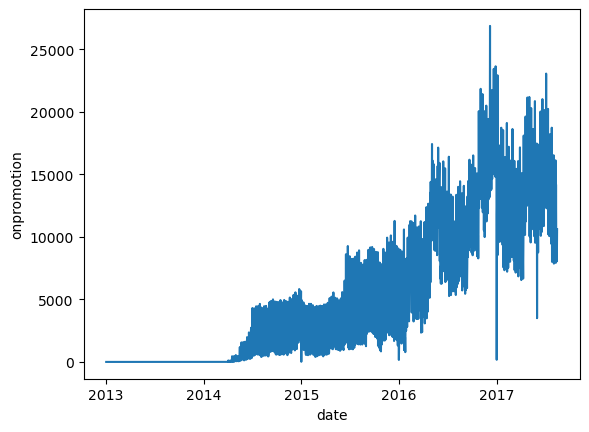

In [200]:
sns.lineplot(data= df_pf, y = 'onpromotion', x = df_pf.index)

<Axes: xlabel='date', ylabel='sales'>

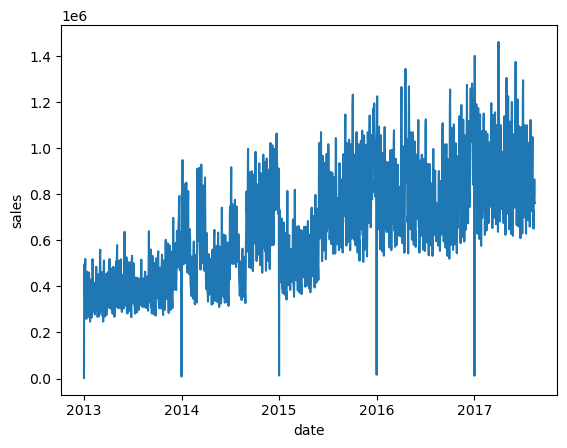

In [201]:
sns.lineplot(data= df_pf, y = 'sales', x = df_pf.index)

In [223]:
df_pf

,sales,onpromotion
date,,
2013-01-01,2511.618999,0
2013-01-02,496092.417944,0
2013-01-03,361461.231124,0
2013-01-04,354459.677093,0
2013-01-05,477350.121229,0
...,...,...
2017-08-11,826373.722022,14179
2017-08-12,792630.535079,8312
2017-08-13,865639.677471,9283


In [291]:
data = {
    'ds' : list(df_pf.index),
    'y'  : list(df_pf['sales']),
    'op' : list(df_pf['onpromotion'])
}

In [293]:
df_p = pd.DataFrame(data)

In [295]:
df_p['ds'] = pd.to_datetime(df_p['ds'])

In [299]:
df_p['ds']

0      2013-01-01
1      2013-01-02
2      2013-01-03
3      2013-01-04
4      2013-01-05
          ...    
1679   2017-08-11
1680   2017-08-12
1681   2017-08-13
1682   2017-08-14
1683   2017-08-15
Name: ds, Length: 1684, dtype: datetime64[ns]

In [301]:
df_p

,ds,y,op
0,2013-01-01,2511.618999,0
1,2013-01-02,496092.417944,0
2,2013-01-03,361461.231124,0
3,2013-01-04,354459.677093,0
4,2013-01-05,477350.121229,0
...,...,...,...
1679,2017-08-11,826373.722022,14179
1680,2017-08-12,792630.535079,8312
1681,2017-08-13,865639.677471,9283
1682,2017-08-14,760922.406081,8043


In [367]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_p['op'] = scaler.fit_transform(df_p[['op']])

In [371]:
mymodel = prophet.Prophet()
mymodel.add_regressor('op')
mymodel.fit(df_p[:1500])

01:58:04 - cmdstanpy - INFO - Chain [1] start processing
01:58:04 - cmdstanpy - INFO - Chain [1] done processing


In [369]:
df_p[1500:]

,ds,y,op
1500,2017-02-13,794314.432067,0.280220
1501,2017-02-14,642613.187069,0.359369
1502,2017-02-15,745780.355084,0.640371
1503,2017-02-16,645968.257067,0.301701
1504,2017-02-17,758855.712790,0.506869
...,...,...,...
1679,2017-08-11,826373.722022,0.527866
1680,2017-08-12,792630.535079,0.309445
1681,2017-08-13,865639.677471,0.345594
1682,2017-08-14,760922.406081,0.299430


In [373]:
future = mymodel.make_future_dataframe(periods=184, include_history=False)

In [375]:
future['op'] = list(df_p[1500:]['op'])

In [377]:
future

,ds,op
0,2017-02-13,0.280220
1,2017-02-14,0.359369
2,2017-02-15,0.640371
3,2017-02-16,0.301701
4,2017-02-17,0.506869
...,...,...
179,2017-08-11,0.527866
180,2017-08-12,0.309445
181,2017-08-13,0.345594
182,2017-08-14,0.299430


In [379]:
forecast = mymodel.predict(future)

In [381]:
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])


            ds           yhat     yhat_lower     yhat_upper
0   2017-02-13  682506.394855  551662.499229  813990.860328
1   2017-02-14  646702.239237  500906.135052  780196.594081
2   2017-02-15  731818.811628  592251.486356  875076.045691
3   2017-02-16  569288.985048  437027.713919  699762.203063
4   2017-02-17  672623.270326  535595.951115  803715.170749
..         ...            ...            ...            ...
179 2017-08-11  635927.898793  495675.166417  778127.524499
180 2017-08-12  784503.602050  662232.754281  929997.378658
181 2017-08-13  848409.461785  715141.553115  987682.604404
182 2017-08-14  636774.968283  502548.083309  775403.735471
183 2017-08-15  611289.145815  469989.799022  746816.380067

[184 rows x 4 columns]


In [383]:
forecast.set_index('ds', inplace = True)

In [385]:
df_pf[1500:]['sales']

date
2017-02-13    794314.432067
2017-02-14    642613.187069
2017-02-15    745780.355084
2017-02-16    645968.257067
2017-02-17    758855.712790
                  ...      
2017-08-11    826373.722022
2017-08-12    792630.535079
2017-08-13    865639.677471
2017-08-14    760922.406081
2017-08-15    762661.935939
Name: sales, Length: 184, dtype: float64

In [387]:
forecast['yhat']

ds
2017-02-13    682506.394855
2017-02-14    646702.239237
2017-02-15    731818.811628
2017-02-16    569288.985048
2017-02-17    672623.270326
                  ...      
2017-08-11    635927.898793
2017-08-12    784503.602050
2017-08-13    848409.461785
2017-08-14    636774.968283
2017-08-15    611289.145815
Name: yhat, Length: 184, dtype: float64

In [389]:
residuals1 = df_pf[1500:]['sales'] - forecast['yhat']

<Axes: xlabel='date'>

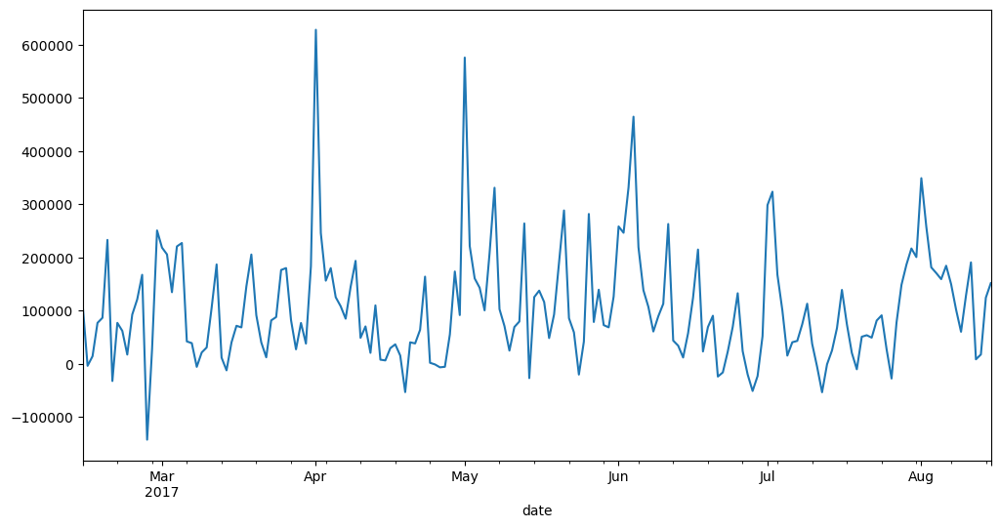

In [391]:
plt.figure(figsize=(12,6))
residuals1.plot()

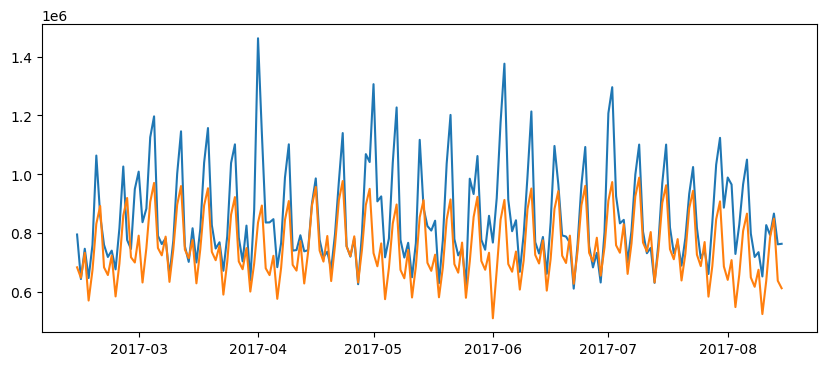

In [393]:
plt.figure(figsize=(10,4))
plt.plot(df_pf[1500:]['sales'])
plt.plot(forecast['yhat'])

In [395]:
print('Mean Absolute Percentage Error: ', round(np.mean(abs(residuals1/df_pf[1500:]['sales'])),4))

Mean Absolute Percentage Error:  0.1185


In [397]:
print('Root Mean Squared Error: ', np.sqrt(np.mean(residuals1**2)))

Root Mean Squared Error:  148209.243814889


In [419]:
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense, Activation, Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.utils import shuffle

In [421]:
scaler = MinMaxScaler(feature_range = (0, 1))

In [435]:
scaler.fit(pd.DataFrame(df_p['op']))

MinMaxScaler()

In [439]:
df_p['op'] = scaler.transform(pd.DataFrame(df_p['op']))

In [443]:
df_p

,ds,y,op
0,2013-01-01,2511.618999,0.000000
1,2013-01-02,496092.417944,0.000000
2,2013-01-03,361461.231124,0.000000
3,2013-01-04,354459.677093,0.000000
4,2013-01-05,477350.121229,0.000000
...,...,...,...
1679,2017-08-11,826373.722022,0.527866
1680,2017-08-12,792630.535079,0.309445
1681,2017-08-13,865639.677471,0.345594
1682,2017-08-14,760922.406081,0.299430
